In [1]:
from itertools import chain
import anndata as ad
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import seaborn as sns

sc.logging.print_header()

Package,Version
anndata,0.12.7
matplotlib,3.10.8
numpy,2.3.5
pandas,2.3.3
scanpy,1.11.5
seaborn,0.13.2
Component,Info
Python,"3.11.14 | packaged by conda-forge | (main, Jan 26 2026, 23:48:32) [GCC 14.3.0]"
OS,Linux-4.18.0-553.129.1.el8_10.x86_64-x86_64-with-glibc2.28
CPU,"128 logical CPU cores, x86_64"


In [2]:
adata = sc.read('RBC_clustering_EM_05.h5ad')

In [3]:
%matplotlib inline
matplotlib.rcParams["figure.figsize"] = (9.0, 9.0)

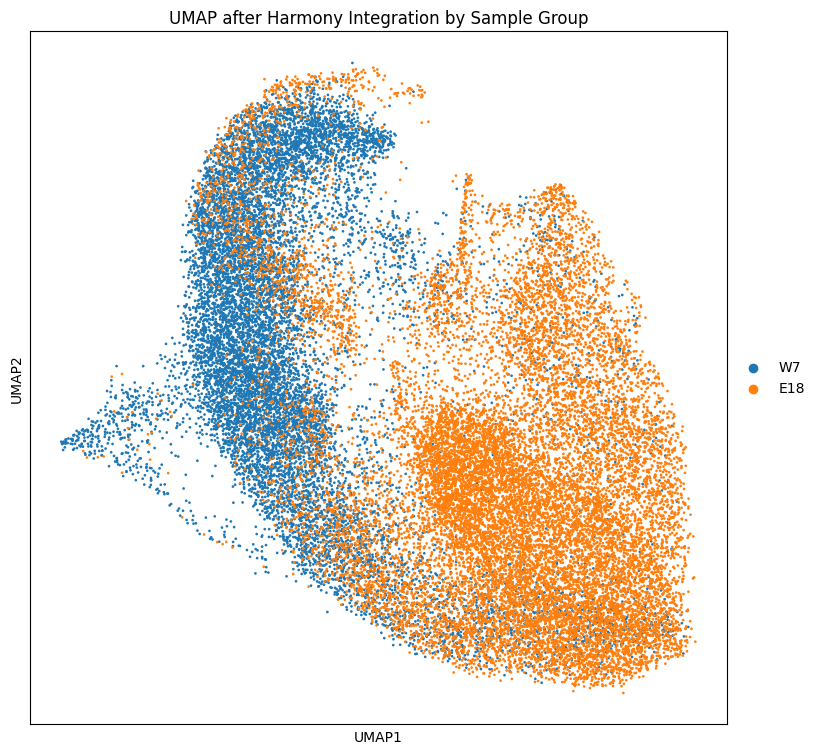

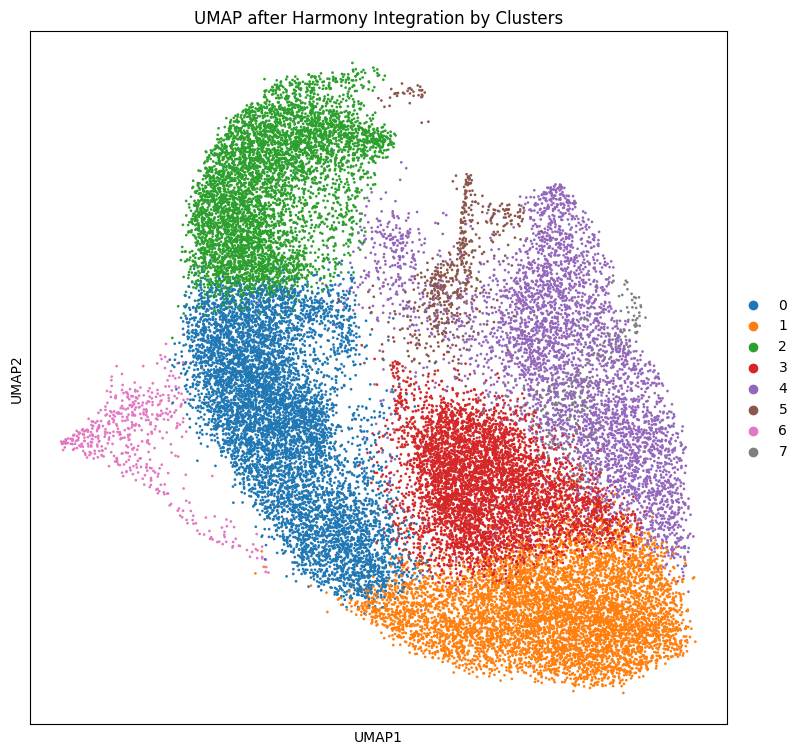

Unique clusters after Harmony integration: ['0', '2', '6', '1', '3', '4', '5', '7']
Categories (8, object): ['0' < '1' < '2' < '3' < '4' < '5' < '6' < '7']


In [32]:
sc.pl.umap(
    adata, 
    color='population', 
    legend_loc='right margin', 
    title='UMAP after Harmony Integration by Sample Group',
    s=15
)

# Step 6: Plot UMAP after Harmony integration by clusters
sc.pl.umap(
    adata, 
    color='leiden', 
    title='UMAP after Harmony Integration by Clusters',
    s=15
)

# Step 7: Check the unique clusters after Harmony integration
print("Unique clusters after Harmony integration:", adata.obs['leiden'].unique())

In [5]:
old_to_new = {
    '0':'Erythroid Progenitor 1',
    '1':'Resting Erythrocytes',
    '2':'Erythroid Progenitor 2',
    '3':'Glycolytically Active Erythrocyte 1',
    '4':'Metabolically Active Erythrocyte',
    '5':'Erythroid Progenitor 3',
    '6':'Immunologically Active Erythrocyte',
    '7':'Glycolytically Active Erythrocyte 2',
    
}
adata.obs['cell type'] = (
    adata.obs['leiden']
    .map(old_to_new)
    .astype('category')
)

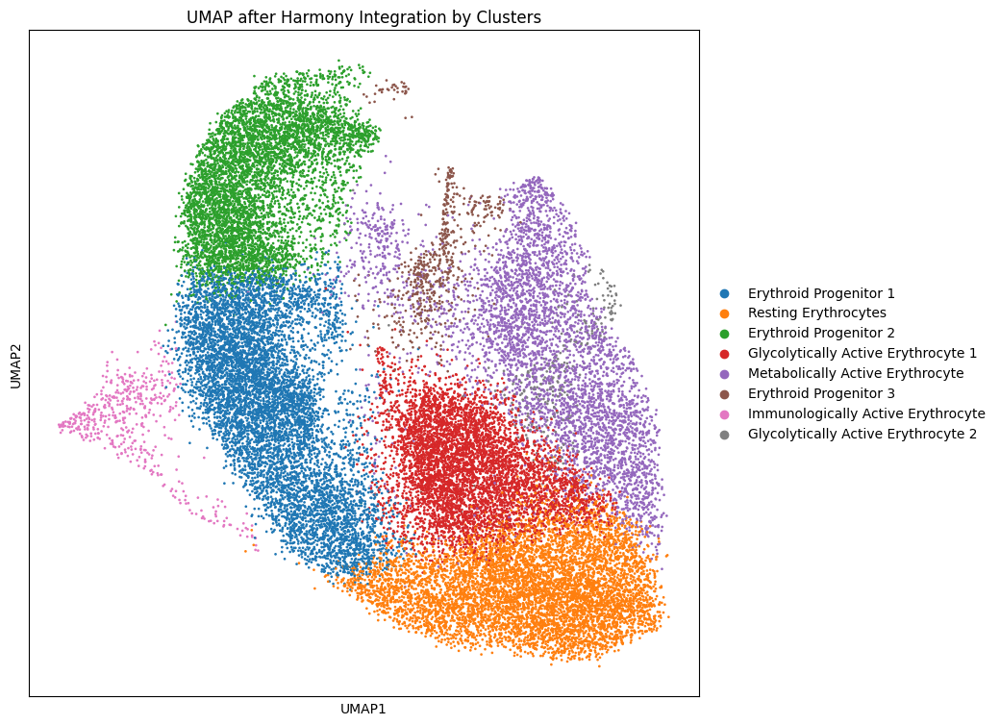

In [6]:
sc.pl.umap(
    adata, 
    color='cell type', 
    title='UMAP after Harmony Integration by Clusters',
    s=15,
    save="_erythrocyte_type"
)

In [7]:
print("Original number of cells per sample:")
print(adata.obs.groupby("leiden").size())

Original number of cells per sample:
leiden
0    7431
1    6685
2    5691
3    5457
4    4294
5     594
6     499
7     275
dtype: int64


/tmp/ipykernel_3745715/1951102606.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(adata.obs.groupby("leiden").size())


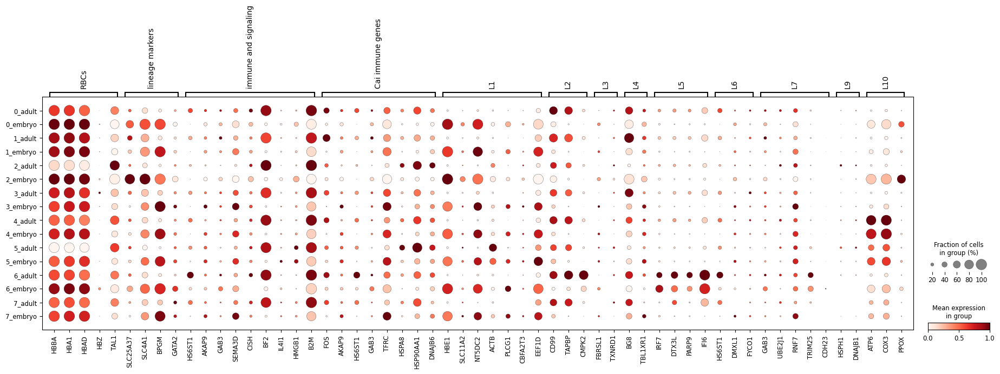

In [8]:
# Define the custom order for clusters (descending) on the Y-axis
cluster_order = [0, 1, 2, 3, 4, 5, 6, 7]
cluster_order = [str(c) for c in cluster_order]  # Ensure leiden values are strings

# Your existing marker genes dictionary
marker_genes = {
    "RBCs": ["HBBA", "HBA1", "HBAD", "HBZ", 'TAL1'],
    "lineage markers":['SLC25A37', 'SLC4A1', 'BPGM', 'GATA2'],
    "immune and signaling":['HS6ST1', 'AKAP9', 'GAB3', 'SEMA3D', 'CISH', 'BF2', 'IL4I1', 'HMGB1', 'B2M'],
    "Cai immune genes":['FOS', 'AKAP9', 'HS6ST1', 'GAB3', 'TFRC', 'HSPA8', 'HSP90AA1', 'DNAJB6'],
    "L1":['HBE1', 'SLC11A2', 'NT5DC2', 'ACTB', 'PLCG1', 'CBFA2T3', 'EEF1D'],
    "L2":['CD99', 'TAPBP', 'CMPK2'],
    "L3":['FBRSL1', 'TXNRD1'],
    "L4":['BG8', 'TBL1XR1'],
    "L5":['IRF7', 'DTX3L', 'PARP9', 'IFI6'],
    "L6":['HS6ST1', 'DMXL1', 'FYCO1'],
    "L7":['GAB3', 'UBE2J1', 'RNF7', 'TRIM25', 'CDH23'],
    "L9":['HSPH1', 'DNAJB1'],
    "L10":['ATP6', 'COX3', 'PPOX'],
   
}

# Ensure leiden is categorical and set the correct order
adata.obs["leiden"] = adata.obs["leiden"].astype("category")
adata.obs["leiden"] = adata.obs["leiden"].cat.reorder_categories(cluster_order, ordered=True)

# Example: Combine 'cell_type' and 'condition' from adata.obs
adata.obs['pop_clus'] = adata.obs['leiden'].astype(str) + '_' + adata.obs['population'].astype(str)
adata.obs['pop_clus'] = adata.obs['pop_clus'].astype('category')

# Create the dot plot with clusters on the Y-axis in descending order
sc.pl.dotplot(
    adata, marker_genes, 
    groupby="pop_clus", 
    standard_scale="var", 
    swap_axes=False,  # Keep clusters on Y-axis (default)
    #save="FINAL-CELLTYPE-dotplot.pdf"

)

In [9]:
# Ensure you are using the t_cell_clusters dataset after reclustering
# Check unique clusters to confirm
print("Unique clusters in rbc_clusters:", adata.obs['leiden'].unique())

# Step 1: Rank genes based on clustering results for T cell clusters
sc.tl.rank_genes_groups(adata, groupby='leiden', method='t-test')

# Step 2: Extract the marker genes table
marker_genes_table = pd.DataFrame(adata.uns["rank_genes_groups"]["names"]).T

# Display the marker genes table
marker_genes_table

Unique clusters in rbc_clusters: ['0', '2', '6', '1', '3', '4', '5', '7']
Categories (8, object): ['0' < '1' < '2' < '3' < '4' < '5' < '6' < '7']


,0,1,2,3,4,5,6,7,8,9,...,15580,15581,15582,15583,15584,15585,15586,15587,15588,15589
0,B2M,BF2,IRF1,BF1,TAPBP,IFI27L2,ENSGALG00000051188,AK2,CREG1,TMEM140,...,COII,NT5DC2,SRSF5,TIMP3,COX3,NT5DC4,PMM1,GPI,ITGB1BP3,BPGM
1,HBAD,HBA1,HBBA,TPT1,RPS20,TSPO2,EIF3E,HBE1,CA2,ACTG1,...,ENSGALG00000022875,BRI3,ITM2B,BF2,HMGN1,EDF1,ENSGALG00000004509,HINTW,CREG1,CNBP
2,HINTW,BF2,B2M,HMGN1,BF1,TAL1,ENSGALG00000004509,ITM2B,HEXIM1,EDF1,...,ITGB1BP3,PMM1,RPS24,HBAD,NT5DC4,ADAL,GPI,BPGM,RPS20,CA2
3,CA2,BPGM,ITGB1BP3,RPS24,RPS19,CA13,RPLP1,RPS10,RPL30,RPS11,...,IFIT5,TAPBP,IL15,ENSGALG00000029381,C15orf48,ENSGALG00000051188,B2M,IRF1,BF1,BF2
4,COX3,COII,MT-CO1,ATP6,CYTB,ND5,ND6,ND1,ND4,MT-ND2,...,ENSGALG00000004509,ENSGALG00000029381,IFIT5,C15orf48,ENSGALG00000051188,IRF1,HINTW,BF1,B2M,BF2
5,TMSB4X,MGP,COII,GPX3,COX3,PPIA,ENSGALG00000050132,RPS20,EEF1A1,SPARC,...,IFIT5,CMPK2,ENSGALG00000053730,IFI6,ENSGALG00000051088,BF1,B2M,ENSGALG00000051188,IRF1,BF2
6,IFI27L2,IFI6,B2M,OASL,IFIT5,BF2,CMPK2,IRF1,BF1,ENSGALG00000012072,...,NT5DC4,GPX3,ACTG1,ENSGALG00000030776,GAPDH,ITGB1BP2,HBE1,ENSGALG00000044661,PMM1,GPI
7,ENSGALG00000033314,SFTPC,ENSGALG00000041833,CA2,CST3,BPGM,ENSGALG00000042748,RPS19,EEF2,ITGB1BP3,...,ENSGALG00000051589,CHAC1,TPCN1,MAK16,ENSGALG00000054505,PLPP6,C4,DPEP2,IRF9,RSAD2


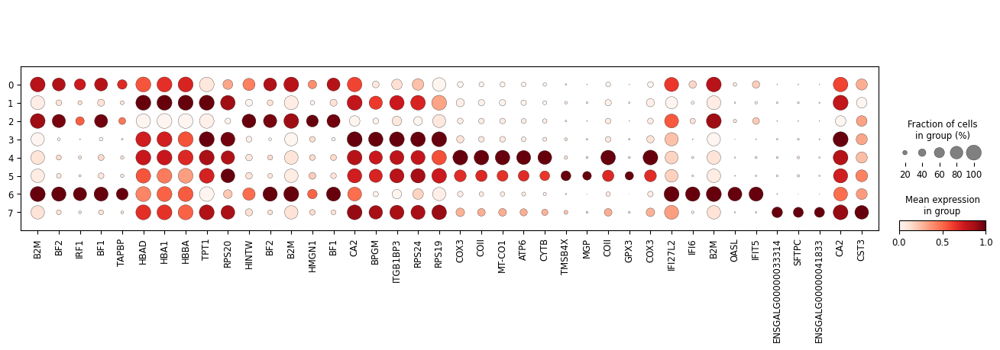

In [10]:
marker_genes_list = list(chain(*marker_genes_table.iloc[:, :5].values))
sc.pl.dotplot(
    adata,
    var_names=marker_genes_list,
    standard_scale="var", 
    groupby="leiden",
)

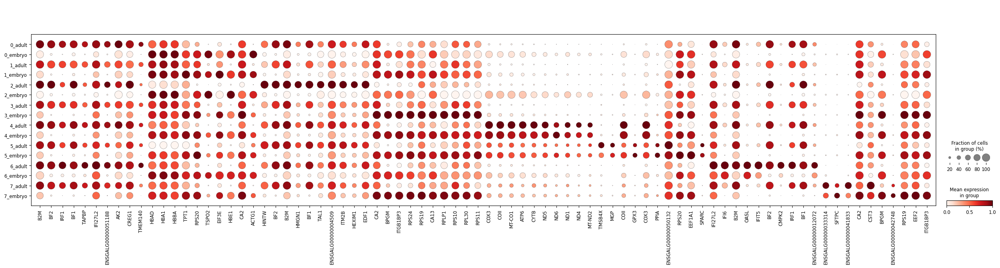

In [11]:
marker_genes_list = list(chain(*marker_genes_table.iloc[:, :10].values))
sc.pl.dotplot(
    adata,
    var_names=marker_genes_list,
    standard_scale="var", 
    groupby="pop_clus",
)

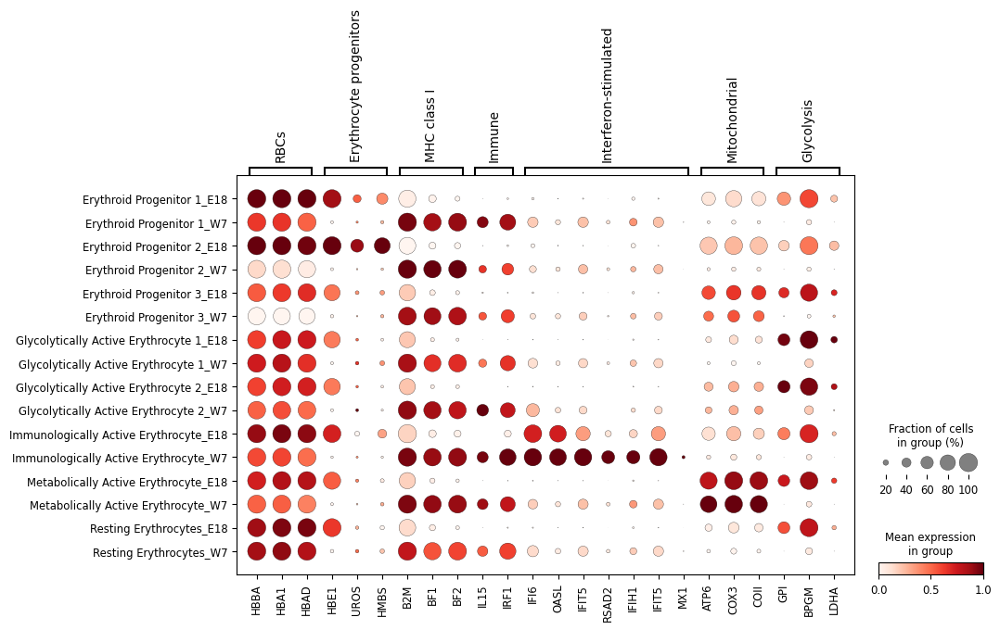

In [55]:
# Define the custom order for clusters (descending) on the Y-axis
cluster_order = ['Erythroid Progenitor 1',
                 'Resting Erythrocytes',
                 'Erythroid Progenitor 2',
                 'Glycolytically Active Erythrocyte 1',
                 'Metabolically Active Erythrocyte',
                 'Erythroid Progenitor 3',
                 'Immunologically Active Erythrocyte',
                 'Glycolytically Active Erythrocyte 2']
cluster_order = [str(c) for c in cluster_order]  # Ensure leiden values are strings

# Your existing marker genes dictionary
marker_genes = {
    "RBCs": ["HBBA", "HBA1", "HBAD"],
    "Erythrocyte progenitors":["HBE1","UROS", "HMBS"],
    "MHC class I":["B2M", "BF1", "BF2"],
    "Immune":["IL15", "IRF1"],
    "Interferon-stimulated": ["IFI6", "OASL", "IFIT5", "RSAD2", "IFIH1", "IFIT5", "MX1"],
    "Mitochondrial":["ATP6", "COX3", "COII"],
    "Glycolysis":["GPI", "BPGM", "LDHA"],
}

# Ensure leiden is categorical and set the correct order
adata.obs["cell type"] = adata.obs["cell type"].astype("category")
adata.obs["cell type"] = adata.obs["cell type"].cat.reorder_categories(cluster_order, ordered=True)

# Example: Combine 'cell_type' and 'condition' from adata.obs
adata.obs['pop_clus'] = adata.obs['cell type'].astype(str) + '_' + adata.obs['population'].astype(str)
adata.obs['pop_clus'] = adata.obs['pop_clus'].astype('category')

# Create the dot plot with clusters on the Y-axis in descending order
sc.pl.dotplot(
    adata, marker_genes, 
    groupby="pop_clus", 
    standard_scale="var", 
    swap_axes=False,  # Keep clusters on Y-axis (default)
    #save="FINAL-CELLTYPE-dotplot.pdf"

)

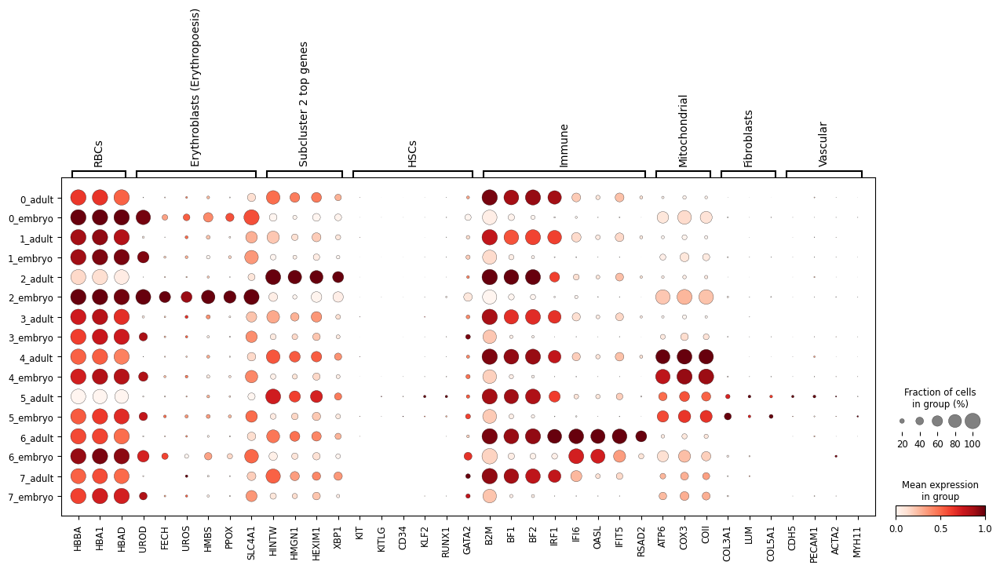

In [13]:
# Define the custom order for clusters (descending) on the Y-axis
cluster_order = [0, 1, 2, 3, 4, 5, 6, 7]
cluster_order = [str(c) for c in cluster_order]  # Ensure leiden values are strings

# Your existing marker genes dictionary
marker_genes = {
    "RBCs": ["HBBA", "HBA1", "HBAD"],
    "Erythroblasts (Erythropoesis)":["UROD", "FECH", "UROS", "HMBS", "PPOX", "SLC4A1"],
    "Subcluster 2 top genes":["HINTW", "HMGN1", "HEXIM1", "XBP1"],
    "HSCs": ["KIT", "KITLG", "CD34", "KLF2", "RUNX1", "GATA2"],
    "Immune": ["B2M", "BF1", "BF2", "IRF1", "IFI6", "OASL", "IFIT5", "RSAD2"],
    "Mitochondrial":["ATP6", "COX3", "COII"],
    "Fibroblasts":["COL3A1", "LUM", "COL5A1"],
    "Vascular":["CDH5", "PECAM1", "ACTA2", "MYH11"],

}

# Ensure leiden is categorical and set the correct order
adata.obs["leiden"] = adata.obs["leiden"].astype("category")
adata.obs["leiden"] = adata.obs["leiden"].cat.reorder_categories(cluster_order, ordered=True)

# Example: Combine 'cell_type' and 'condition' from adata.obs
adata.obs['pop_clus'] = adata.obs['leiden'].astype(str) + '_' + adata.obs['population'].astype(str)
adata.obs['pop_clus'] = adata.obs['pop_clus'].astype('category')

# Create the dot plot with clusters on the Y-axis in descending order
sc.pl.dotplot(
    adata, marker_genes, 
    groupby="pop_clus", 
    standard_scale="var", 
    swap_axes=False,  # Keep clusters on Y-axis (default)
    #save="FINAL-CELLTYPE-dotplot.pdf"
)

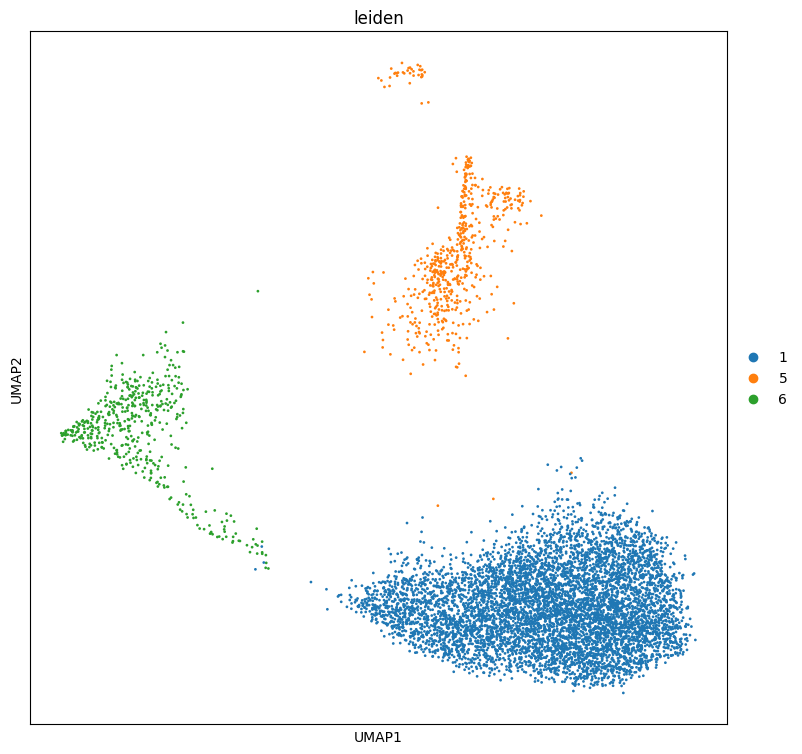

In [14]:
# Ensure Leiden clusters are in string format
adata.obs['leiden'] = adata.obs['leiden'].astype(str)

# Subset to clusters 6, 9, 15, and 16
subset_clusters = ['5', '1', '6']
adata_sub = adata[adata.obs['leiden'].isin(subset_clusters)].copy()

# Check UMAP to visualize the subset
sc.pl.umap(adata_sub, color=['leiden'])

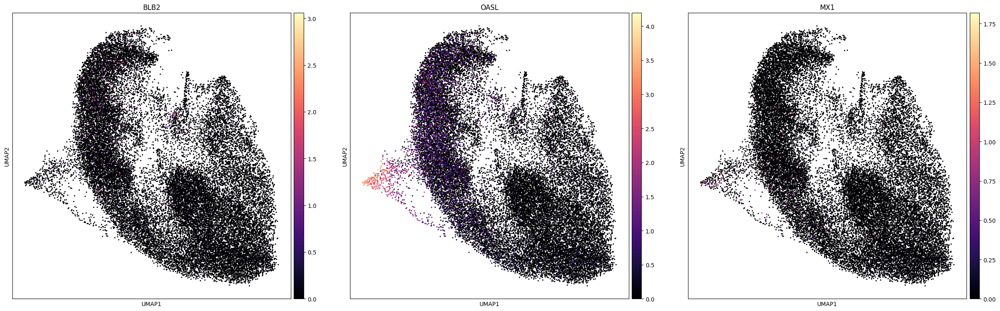

In [15]:
surfactant_genes = [
    "BLB2", "OASL", "MX1"
]
sc.pl.umap(
    adata,
    color=surfactant_genes,
    cmap = 'magma',
    #title=t_cell_genes.symbol,
    s=20
)

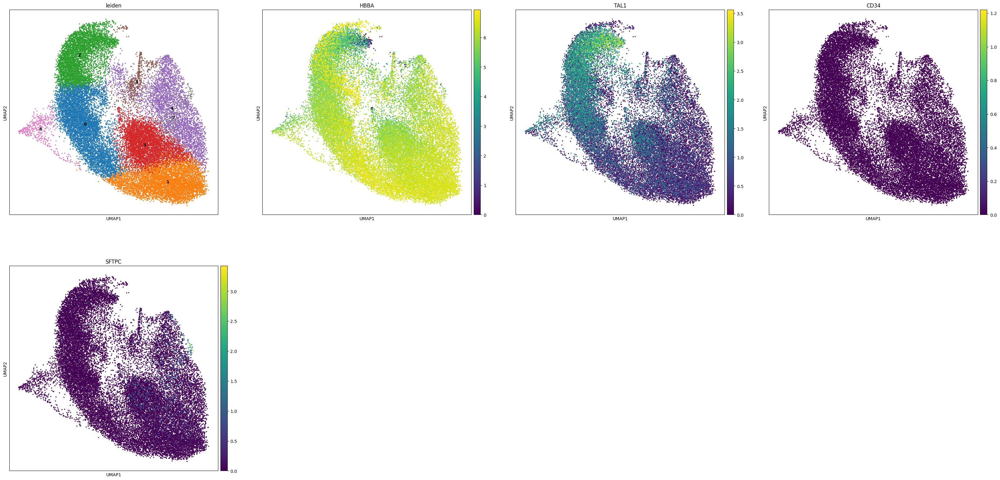

In [16]:
sc.pl.umap(adata, color = ['leiden','HBBA','TAL1', 'CD34', 'SFTPC'], legend_loc='on data', s=25)

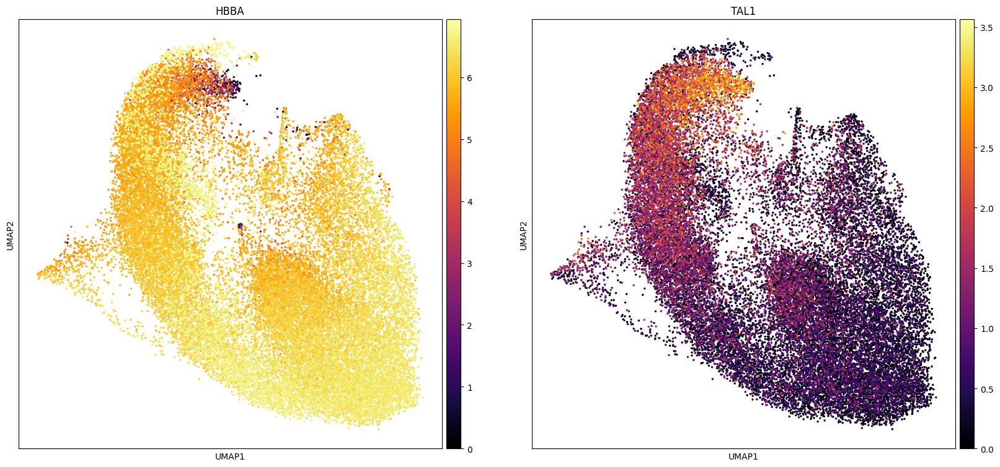

In [17]:
sc.pl.umap(adata, color = ['HBBA', 'TAL1'], legend_loc='on data', s=25, cmap='inferno')

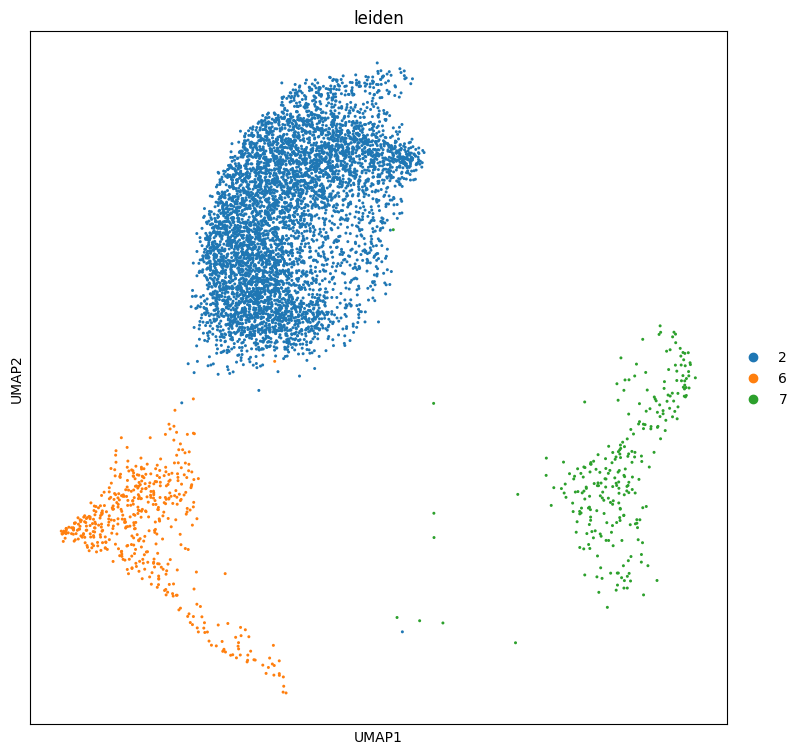

In [18]:
# Ensure Leiden clusters are in string format
adata.obs['leiden'] = adata.obs['leiden'].astype(str)

# Subset to clusters 6, 9, 15, and 16
subset_clusters = ['2', '6', '7']
adata_sub = adata[adata.obs['leiden'].isin(subset_clusters)].copy()

# Check UMAP to visualize the subset
sc.pl.umap(adata_sub, color=['leiden'])

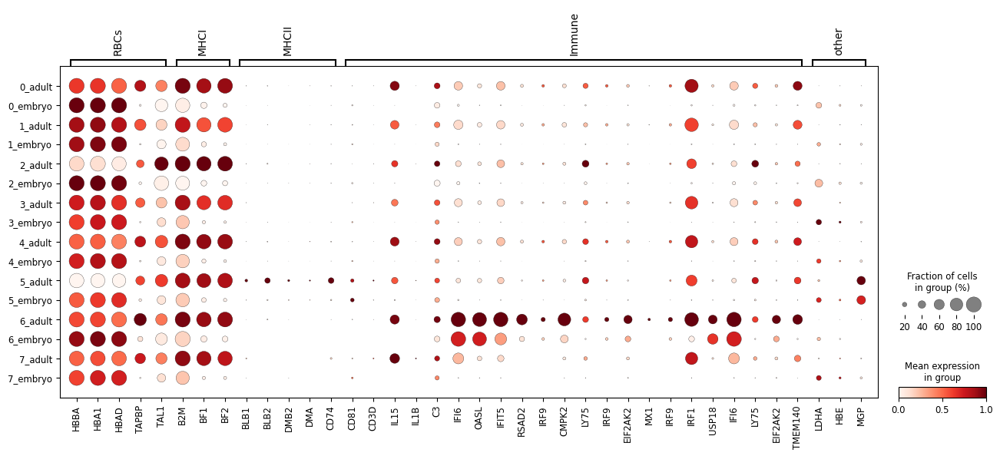

In [19]:
# Define the custom order for clusters (descending) on the Y-axis
cluster_order = [0, 1, 2, 3, 4, 5, 6, 7]
cluster_order = [str(c) for c in cluster_order]  # Ensure leiden values are strings

# Your existing marker genes dictionary
marker_genes = {
    "RBCs": ["HBBA", "HBA1", "HBAD", "TAPBP", "TAL1"],
    "MHCI": ["B2M", "BF1", "BF2"],
    "MHCII": ["BLB1", "BLB2", "DMB2", "DMA", "CD74"],
    "Immune": ["CD81", "CD3D", "IL15", "IL1B", "C3", "IFI6", "OASL", "IFIT5", "RSAD2", "IRF9", "CMPK2" ,"LY75", "IRF9", "EIF2AK2", "MX1", "IRF9", "IRF1", "USP18","IFI6", "LY75", "EIF2AK2", "TMEM140"],
    "other": ["LDHA", "HBE", "MGP"]
}

# Ensure leiden is categorical and set the correct order
adata.obs["leiden"] = adata.obs["leiden"].astype("category")
adata.obs["leiden"] = adata.obs["leiden"].cat.reorder_categories(cluster_order, ordered=True)

# Example: Combine 'cell_type' and 'condition' from adata.obs
adata.obs['pop_clus'] = adata.obs['leiden'].astype(str) + '_' + adata.obs['population'].astype(str)
adata.obs['pop_clus'] = adata.obs['pop_clus'].astype('category')

# Create the dot plot with clusters on the Y-axis in descending order
sc.pl.dotplot(
    adata, marker_genes, 
    groupby="pop_clus", 
    standard_scale="var", 
    swap_axes=False,  # Keep clusters on Y-axis (default)
    #save="FINAL-CELLTYPE-dotplot.pdf"

)

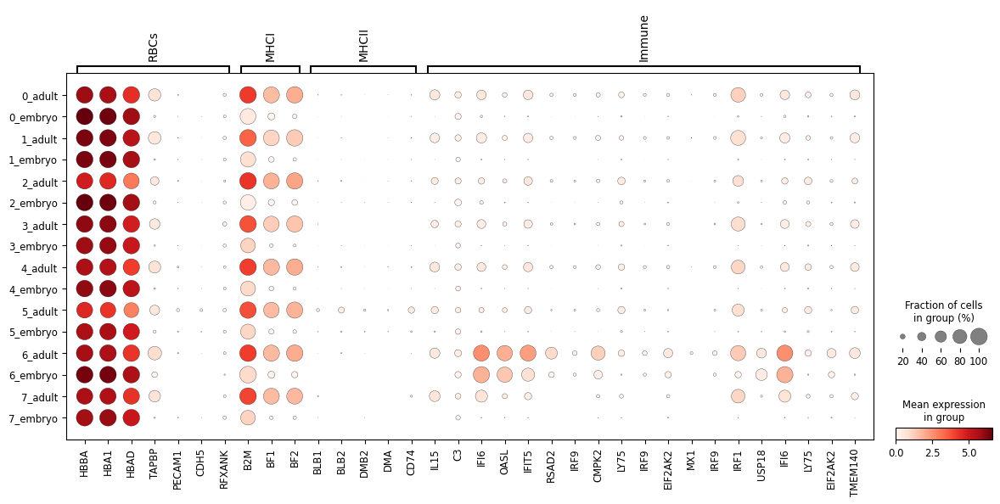

In [20]:
# Define the custom order for clusters (descending) on the Y-axis
cluster_order = [0, 1, 2, 3, 4, 5, 6, 7]
cluster_order = [str(c) for c in cluster_order]  # Ensure leiden values are strings

# Your existing marker genes dictionary
marker_genes = {
    "RBCs": ["HBBA", "HBA1", "HBAD", "TAPBP", "PECAM1", "CDH5", "RFXANK"],
    "MHCI": ["B2M", "BF1", "BF2"],
    "MHCII": ["BLB1", "BLB2", "DMB2", "DMA", "CD74"],
    "Immune": ["IL15", "C3", "IFI6", "OASL", "IFIT5", "RSAD2", "IRF9", "CMPK2" ,"LY75", "IRF9", "EIF2AK2", "MX1", "IRF9", "IRF1", "USP18","IFI6", "LY75", "EIF2AK2", "TMEM140"]
}

# Ensure leiden is categorical and set the correct order
adata.obs["leiden"] = adata.obs["leiden"].astype("category")
adata.obs["leiden"] = adata.obs["leiden"].cat.reorder_categories(cluster_order, ordered=True)

# Example: Combine 'cell_type' and 'condition' from adata.obs
adata.obs['pop_clus'] = adata.obs['leiden'].astype(str) + '_' + adata.obs['population'].astype(str)
adata.obs['pop_clus'] = adata.obs['pop_clus'].astype('category')

# Create the dot plot with clusters on the Y-axis in descending order
sc.pl.dotplot(
    adata, marker_genes, 
    groupby="pop_clus",  
    swap_axes=False,  # Keep clusters on Y-axis (default)
    #save="FINAL-CELLTYPE-dotplot.pdf"

)

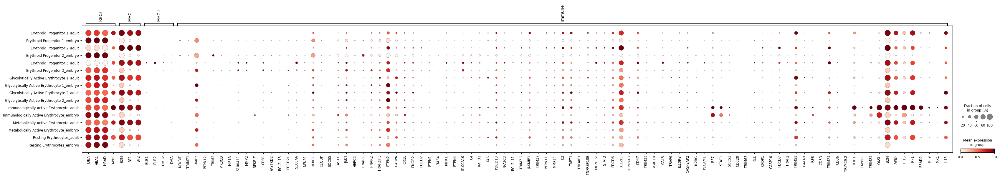

In [21]:
# Define the custom order for clusters (descending) on the Y-axis
cluster_order = ['Erythroid Progenitor 1',
                 'Resting Erythrocytes',
                 'Erythroid Progenitor 2',
                 'Glycolytically Active Erythrocyte 1',
                 'Metabolically Active Erythrocyte',
                 'Erythroid Progenitor 3',
                 'Immunologically Active Erythrocyte',
                 'Glycolytically Active Erythrocyte 2']
cluster_order = [str(c) for c in cluster_order]  # Ensure leiden values are strings

# Your existing marker genes dictionary
marker_genes = {
    "RBCs": ["HBBA", "HBA1", "HBAD", "TAPBP"],
    "MHCI": ["B2M", "BF1", "BF2"],
    "MHCII": ["BLB1", "BLB2", "DMB2", "DMA"],
    "Immune": ["NFKBIE", "TRIM71", "TIMP3", "PTPN12", "TRIM2", "PIK3CD", "HIF1A", "S100A11", "MMP2", "NFKBIZ", "CD81", "FASTKD2", "BCL2L13", "PDCD2L", "S100A6", "NFKB1", "HERC1", "C1QBP", "SOCS5", "FASTK", "JAK1", "HERC3", "IFNAR1", "IFNAR2", "TRAF3IP3", "PTPN2", "C4BPA", "CR1L", "IFNGR2", "PDCD2", "PTPN1", "PIAS4", "RIPK1", "PTPN4", "S100A10", "C4", "TRAFD1", "FAS", "PDCD10", "NFATC3", "BCL2L11", "TRIM7.2", "JAKMIP1", "TRIM37", "PTPN11", "MMP24", "C3", "TAPT1", "TNFAIP1", "TNFRSF10B", "IRF2BP2", "STAT3", "PDCD6", "BCL2L1", "TRIM39.1", "CD47", "TRIM33", "VSIG10", "CALR", "TRAF6", "IL10RB", "CASP8AP2", "IL2RG", "PECAM1", "IRF7", "STAT1", "SOCS1", "CD320", "TRIM63", "REL", "CFDP1", "CASP10", "PDCD7", "TRAF2", "TRIM59", "GATA3", "IRF8", "CD3D", "TRIM24", "CD36", "TRIM39.2", "IFIH1", "TAPBPL", "TRIM25", "OASL", "B2M", "TAPBP", "IFIT5", "IRF1", "RSAD2", "IRF9", "MX1", "IL15"]
}

# Ensure leiden is categorical and set the correct order
adata.obs["cell type"] = adata.obs["cell type"].astype("category")
adata.obs["cell type"] = adata.obs["cell type"].cat.reorder_categories(cluster_order, ordered=True)

# Example: Combine 'cell_type' and 'condition' from adata.obs
adata.obs['pop_clus'] = adata.obs['cell type'].astype(str) + '_' + adata.obs['population'].astype(str)
adata.obs['pop_clus'] = adata.obs['pop_clus'].astype('category')

# Create the dot plot with clusters on the Y-axis in descending order
sc.pl.dotplot(
    adata, marker_genes, 
    groupby="pop_clus", 
    standard_scale="var", 
    swap_axes=False,  # Keep clusters on Y-axis (default)
    #save="FINAL-CELLTYPE-dotplot.pdf"

)

In [22]:
print("Original number of cells per sample:")
print(adata.obs.groupby("pop_clus").size())

Original number of cells per sample:
pop_clus
Erythroid Progenitor 1_adult                  5971
Erythroid Progenitor 1_embryo                 1460
Erythroid Progenitor 2_adult                  4750
Erythroid Progenitor 2_embryo                  941
Erythroid Progenitor 3_adult                    58
Erythroid Progenitor 3_embryo                  536
Glycolytically Active Erythrocyte 1_adult      123
Glycolytically Active Erythrocyte 1_embryo    5334
Glycolytically Active Erythrocyte 2_adult       34
Glycolytically Active Erythrocyte 2_embryo     241
Immunologically Active Erythrocyte_adult       470
Immunologically Active Erythrocyte_embryo       29
Metabolically Active Erythrocyte_adult         632
Metabolically Active Erythrocyte_embryo       3662
Resting Erythrocytes_adult                    1234
Resting Erythrocytes_embryo                   5451
dtype: int64


/tmp/ipykernel_3745715/1067413864.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(adata.obs.groupby("pop_clus").size())


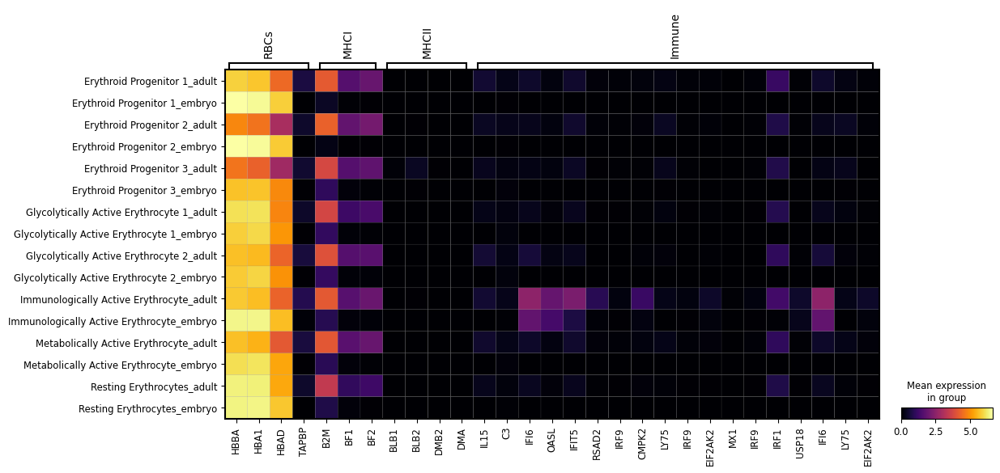

In [23]:
marker_genes = {
    "RBCs": ["HBBA", "HBA1", "HBAD", "TAPBP"],
    "MHCI": ["B2M", "BF1", "BF2"],
    "MHCII": ["BLB1", "BLB2", "DMB2", "DMA"],
    "Immune": ["IL15", "C3", "IFI6", "OASL", "IFIT5", "RSAD2", "IRF9", "CMPK2" ,"LY75", "IRF9", "EIF2AK2", "MX1", "IRF9", "IRF1", "USP18","IFI6", "LY75", "EIF2AK2"]
}
sc.pl.matrixplot(adata, groupby='pop_clus', var_names=marker_genes, cmap='inferno')

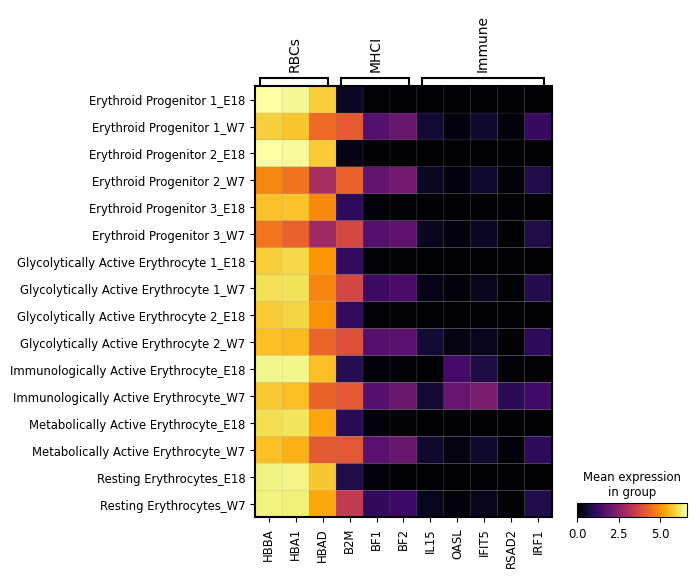

In [65]:
marker_genes = {
    "RBCs": ["HBBA", "HBA1", "HBAD"],
    "MHCI": ["B2M", "BF1", "BF2"],
    "Immune": ["IL15", "OASL", "IFIT5", "RSAD2", "IRF1",]
}
sc.pl.matrixplot(adata, groupby='pop_clus', var_names=marker_genes, cmap='inferno')

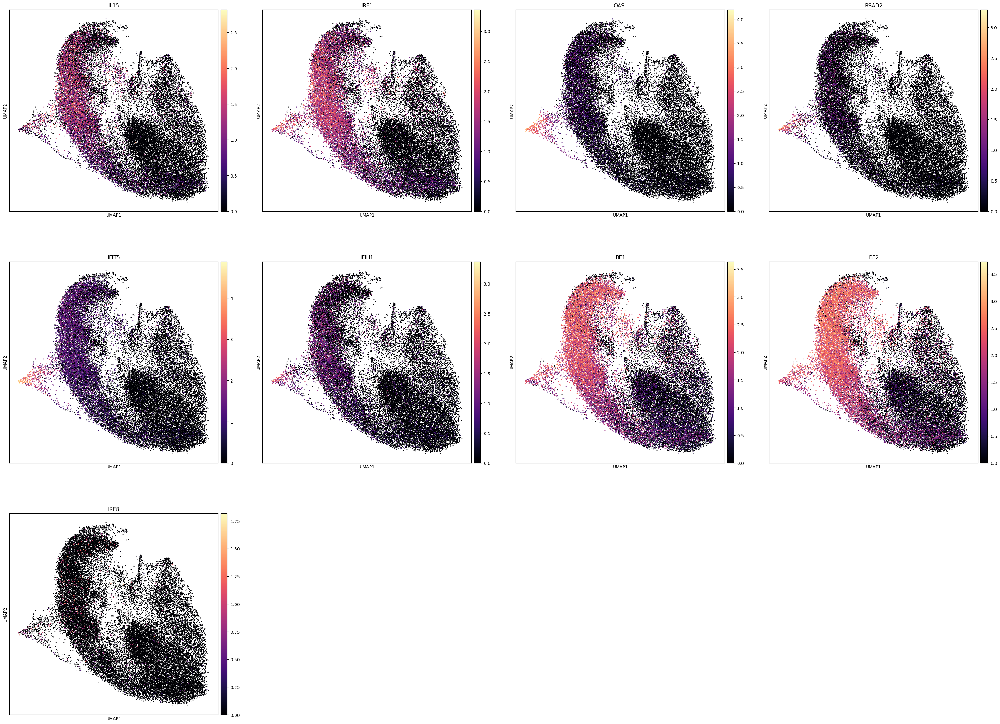

In [59]:
immune_genes = [
    "IL15", "IRF1", "OASL", "RSAD2", "IFIT5", "IFIH1", "BF1", "BF2", "IRF8"
]
sc.pl.umap(
    adata,
    color=immune_genes,
    cmap = 'magma',
    #title=t_cell_genes.symbol,
    s=20
)

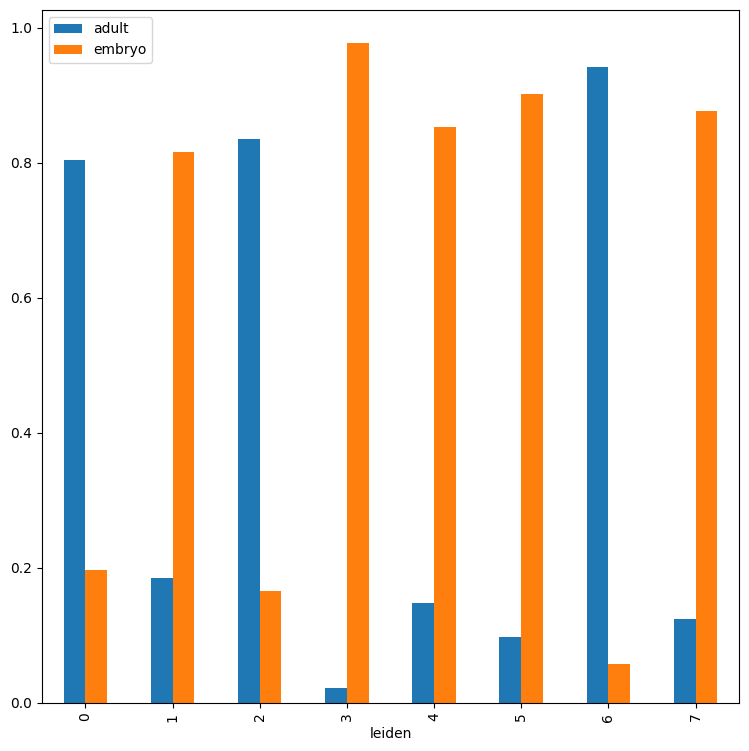

In [24]:
tmp = pd.crosstab(adata.obs['leiden'],adata.obs['population'], normalize='index')
tmp.plot.bar(stacked=False).legend(loc='upper left')

In [25]:
sc.tl.rank_genes_groups(adata, groupby="leiden")
marker_genes_table = pd.DataFrame(adata.uns["rank_genes_groups"]["names"]).head(100).T
marker_genes_table

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,B2M,BF2,IRF1,BF1,TAPBP,IFI27L2,ENSGALG00000051188,AK2,CREG1,TMEM140,...,TUT4,WBP1L,KIAA1671,SYNM,YF5,ENSGALG00000044935,HERC2,ENSGALG00000009879,IFI35,KMT2E
1,HBAD,HBA1,HBBA,TPT1,RPS20,TSPO2,EIF3E,HBE1,CA2,ACTG1,...,TGM2-1,PFDN4,RAB5B,COX5A,GPI,RPL34,LSAMP,TMLHE,ENSGALG00000030512,KCTD20
2,HINTW,BF2,B2M,HMGN1,BF1,TAL1,ENSGALG00000004509,ITM2B,HEXIM1,EDF1,...,CDV3,NHP2,MARCH5,SLC35B1,NDUFB10,SUMO3,TARDBP,ENSGALG00000053682,ENSGALG00000001720,ZNF326
3,CA2,BPGM,ITGB1BP3,RPS24,RPS19,CA13,RPLP1,RPS10,RPL30,RPS11,...,ENSGALG00000011296,SLC16A10,UROD,EIF3D,ENSGALG00000045228,BAZ2B,SLC25A6,GBP,EIF3M,ENSGALG00000003966
4,COX3,COII,MT-CO1,ATP6,CYTB,ND5,ND6,ND1,ND4,MT-ND2,...,GLRX,KATNA1,EIF3F,RXRA,RNF166,SSBP3,SYN3,ENSGALG00000014736,ENSGALG00000015617,HPCAL1
5,TMSB4X,MGP,COII,GPX3,COX3,PPIA,ENSGALG00000050132,RPS20,EEF1A1,SPARC,...,RPSAP58,SDC2,RBM3,TUBA1A,PMP22,CD81,ANXA2,RPL7,RPL19,TMSB15B
6,IFI27L2,IFI6,B2M,OASL,IFIT5,BF2,CMPK2,IRF1,BF1,ENSGALG00000012072,...,ADAR,VPS25,NMI,LAMP1,RPL27,ENSGALG00000044841,ATP6V1A,IRF9,NANP,LIPA
7,ENSGALG00000033314,SFTPC,ENSGALG00000041833,CA2,CST3,BPGM,ENSGALG00000042748,RPS19,EEF2,ITGB1BP3,...,SLC16A10,PABPC1,SLC25A6,PLEKHB2,TRAPPC13,SDHD,ENSGALG00000031149,RPL35,LDHA,CSTF3


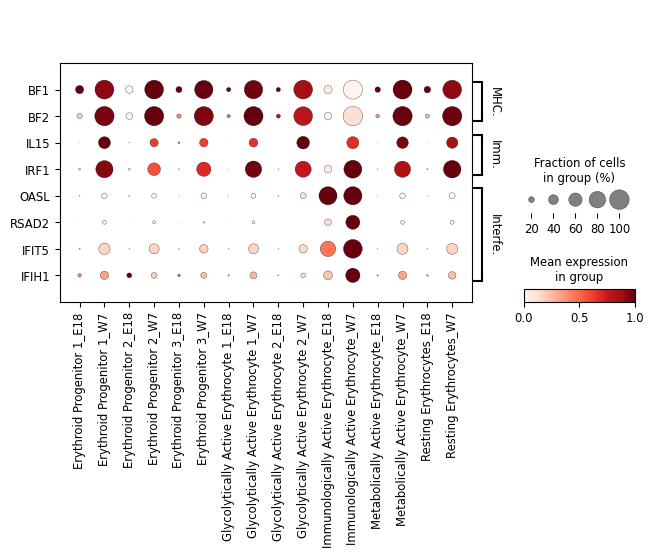

In [67]:
# Define the custom order for clusters (descending) on the Y-axis
cluster_order = ['Erythroid Progenitor 1',
                 'Resting Erythrocytes',
                 'Erythroid Progenitor 2',
                 'Glycolytically Active Erythrocyte 1',
                 'Metabolically Active Erythrocyte',
                 'Erythroid Progenitor 3',
                 'Immunologically Active Erythrocyte',
                 'Glycolytically Active Erythrocyte 2']
cluster_order = [str(c) for c in cluster_order]  # Ensure leiden values are strings

# Your existing marker genes dictionary
marker_genes = {
    "MHCI":["BF1", "BF2"],
    "Immune":["IL15", "IRF1"],
    "Interferon": ["OASL", "RSAD2", "IFIT5", "IFIH1"],
}

# Ensure leiden is categorical and set the correct order
adata.obs["cell type"] = adata.obs["cell type"].astype("category")
adata.obs["cell type"] = adata.obs["cell type"].cat.reorder_categories(cluster_order, ordered=True)

# Example: Combine 'cell_type' and 'condition' from adata.obs
adata.obs['pop_clus'] = adata.obs['cell type'].astype(str) + '_' + adata.obs['population'].astype(str)
adata.obs['pop_clus'] = adata.obs['pop_clus'].astype('category')

# Create the dot plot with clusters on the Y-axis in descending order
sc.pl.dotplot(
    adata, marker_genes, 
    groupby="pop_clus", 
    standard_scale="var", 
    swap_axes=True,  # Keep clusters on Y-axis (default)
    #save="FINAL-CELLTYPE-dotplot.pdf"

)

In [40]:
adata.obs['leiden'][adata.obs['leiden'].isin(['0', '1', '2', '3', '4', '5', '7'])]='0'
adata.obs['leiden']=adata.obs['leiden'].astype('str').astype('category')

/tmp/ipykernel_3745715/679059742.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.obs['leiden'][adata.obs['leiden'].isin(['0', '1', '2', '3', '4', '5', '7'])]='0'


In [41]:
old_to_new = {
    '0':'Non-immune Erythrocytes',
    '6':'Immune Erythrocytes',

}
adata.obs['Immune'] = (
    adata.obs['leiden']
    .map(old_to_new)
    .astype('category')
)

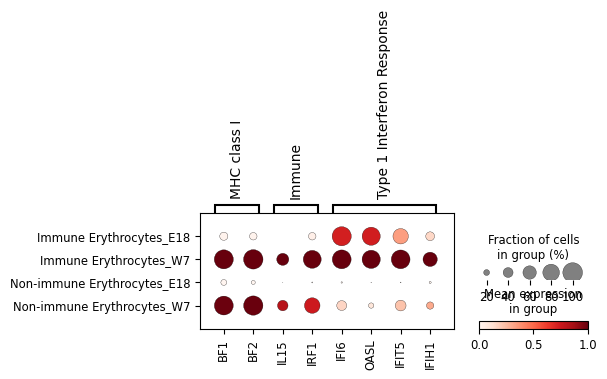

In [81]:
# Define the custom order for clusters (descending) on the Y-axis
cluster_order = ['Non-immune Erythrocytes',
                 'Immune Erythrocytes']
cluster_order = [str(c) for c in cluster_order]  # Ensure leiden values are strings

# Your existing marker genes dictionary
marker_genes = {
    "MHC class I":["BF1", "BF2"],
    "Immune":["IL15", "IRF1"],
    "Type 1 Interferon Response": ["IFI6", "OASL", "IFIT5", "IFIH1"],
}

# Ensure leiden is categorical and set the correct order
adata.obs["Immune"] = adata.obs["Immune"].astype("category")
adata.obs["Immune"] = adata.obs["Immune"].cat.reorder_categories(cluster_order, ordered=True)

# Example: Combine 'cell_type' and 'condition' from adata.obs
adata.obs['pop_clus'] = adata.obs['Immune'].astype(str) + '_' + adata.obs['population'].astype(str)
adata.obs['pop_clus'] = adata.obs['pop_clus'].astype('category')

# Create the dot plot with clusters on the Y-axis in descending order
sc.pl.dotplot(
    adata, marker_genes, 
    groupby="pop_clus", 
    standard_scale="var", 
    figsize=(5, 1.5),
    swap_axes=False,  # Keep clusters on Y-axis (default)
    #save="FINAL-CELLTYPE-dotplot.pdf"

)

In [ ]:
%pip list